# Importing libraries

In [2]:
!pip install opendatasets

In [1]:
import os
import shutil
import opendatasets as od
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from tqdm import tqdm
import numpy as np
import cv2

# loading the dataset and filtering Classes from dataset

In [3]:
od.download("https://www.kaggle.com/datasets/jessicali9530/lfw-dataset")
original_path = "lfw-dataset/lfw-deepfunneled/lfw-deepfunneled"
filtered_path = "filtered_lfw"
os.makedirs(filtered_path, exist_ok=True)

class_info = []
for class_name in os.listdir(original_path):
    class_dir = os.path.join(original_path, class_name)
    if os.path.isdir(class_dir):
        image_files = os.listdir(class_dir)
        if len(image_files) >= 10:
            class_info.append((class_name, len(image_files)))

df_classes = pd.DataFrame(class_info, columns=["Class Name", "Image Count"])
df_classes = df_classes.sort_values(by="Image Count", ascending=False)
print("Top 10 Classes:")
print(df_classes.head(10))

selected_classes = df_classes.head(10)["Class Name"].tolist()
for cls in selected_classes:
    src = os.path.join(original_path, cls)
    dst = os.path.join(filtered_path, cls)
    os.makedirs(dst, exist_ok=True)
    for img in os.listdir(src):
        shutil.copy(os.path.join(src, img), os.path.join(dst, img))


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: Sachin
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/lfw-dataset
Top 10 Classes:
            Class Name  Image Count
131      George_W_Bush          530
14        Colin_Powell          236
120         Tony_Blair          144
41     Donald_Rumsfeld          121
138  Gerhard_Schroeder          109
88        Ariel_Sharon           77
125        Hugo_Chavez           71
15   Junichiro_Koizumi           60
7        Jean_Chretien           55
59       John_Ashcroft           53


# Some samples of the class

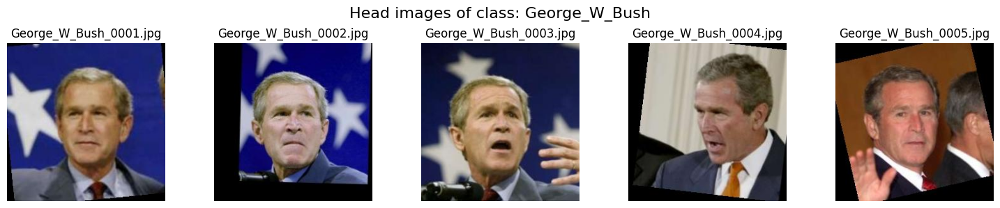

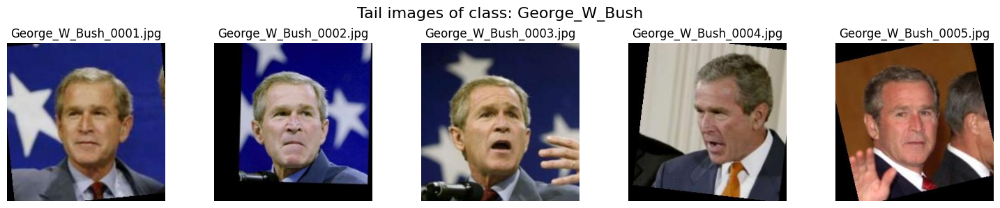

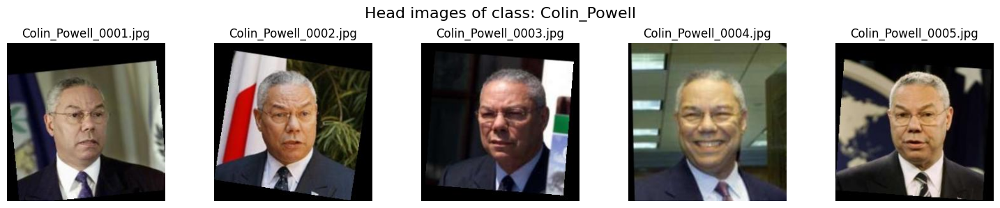

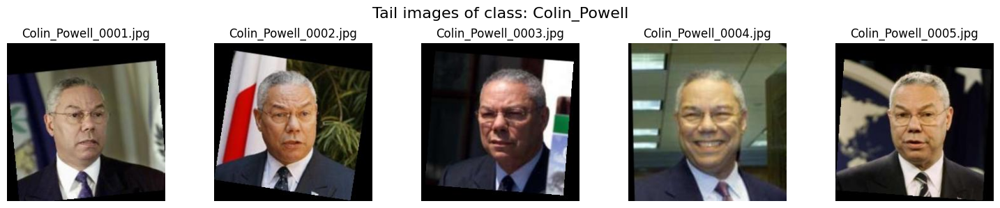

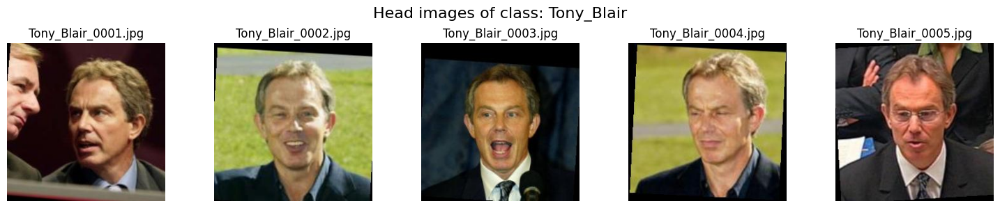

...

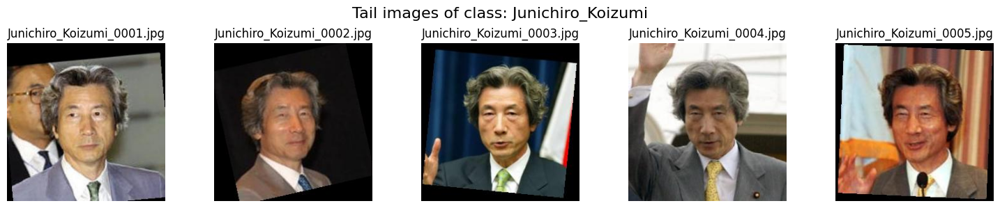

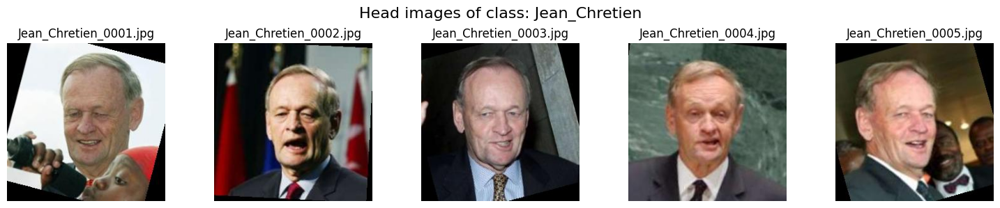

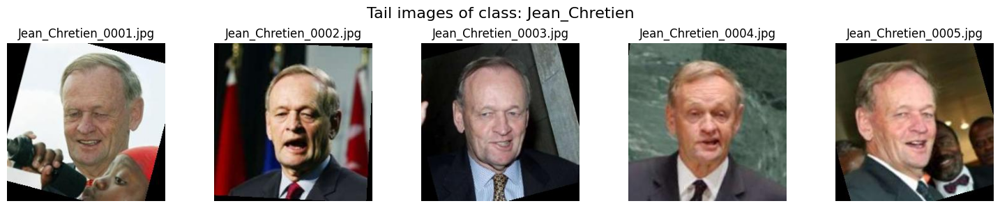

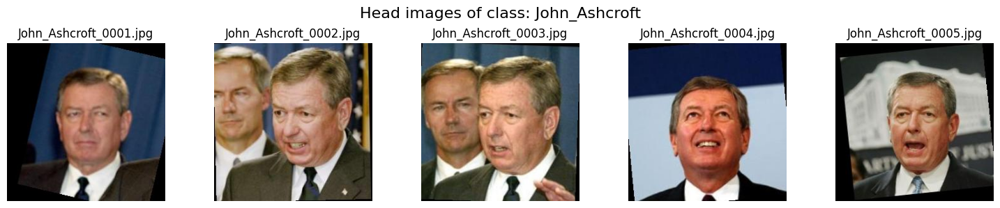

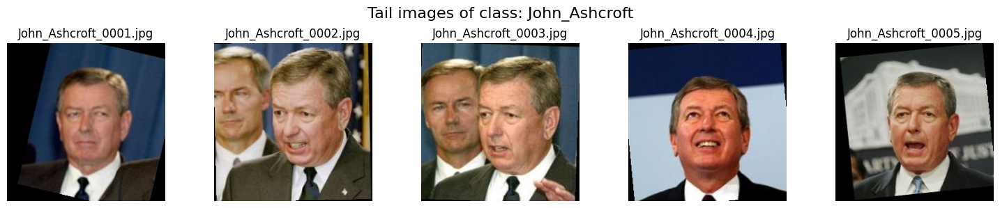

In [4]:
def show_images(class_path, title, n=5):
    fig, axes = plt.subplots(1, n, figsize=(15, 3))
    fig.suptitle(title, fontsize=16)
    images = sorted(os.listdir(class_path))  # to get head/tail in order
    sample_images = images[:n]
    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(class_path, img_file)
        image = mpimg.imread(img_path)
        axes[i].imshow(image)
        axes[i].set_title(img_file)
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Display head and tail for 10 sample classes
for cls in selected_classes[:10]:
    class_path = os.path.join(filtered_path, cls)
    show_images(class_path, f"Head images of class: {cls}")
    show_images(class_path, f"Tail images of class: {cls}", n=5)

# Data Preprocessing

In [5]:
from torchvision import datasets, transforms
from torch.utils.data import random_split

# 1. Define data transformations for training and validation
# Training Transform includes data augmentation: random flips, rotations, and color jitter
train_transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize all images to 128x128
    transforms.RandomHorizontalFlip(),  # Random horizontal flip for augmentation
    transforms.RandomRotation(15),  # Random rotation up to 15 degrees
    transforms.ColorJitter(0.3, 0.3, 0.2),  # Random changes in brightness, contrast, and saturation
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize([0.5]*3, [0.5]*3)  # Normalize to mean=0.5 and std=0.5 for each channel
])

# Validation Transform only resizes and normalizes the images (no augmentation)
val_transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize to match training input size
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

# 2. Load the dataset from the filtered image directory using ImageFolder
# Apply training transform initially
dataset = datasets.ImageFolder(root=filtered_path, transform=train_transform)

# 3. Get class-to-index mapping
class_to_idx = dataset.class_to_idx

# 4. Split dataset into 70% training and 30% validation
train_size = int(0.7 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

# 5. Set validation dataset to use validation transform
val_dataset.dataset.transform = val_transform

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define DataLoader for validation set
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=True)


# Model Selection and Architecture:

In [6]:
# Function to get a simple custom CNN model
def get_model(num_classes):
    class SimpleCNN(nn.Module):
        def __init__(self, num_classes):
            super(SimpleCNN, self).__init__()
            self.features = nn.Sequential(
                nn.Conv2d(3, 16, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2),  # 64x64
                nn.Conv2d(16, 32, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2),  # 32x32
                nn.Conv2d(32, 64, kernel_size=3, padding=1),
                nn.ReLU(),
                nn.MaxPool2d(2)   # 16x16
            )
            self.classifier = nn.Sequential(
                nn.Flatten(),
                nn.Linear(64 * 16 * 16, 128),
                nn.ReLU(),
                nn.Dropout(0.5),
                nn.Linear(128, num_classes)
            )

        def forward(self, x):
            x = self.features(x)
            x = self.classifier(x)
            return x

    return SimpleCNN(num_classes)


#  Model Training

In [7]:
from sklearn.metrics import precision_score, recall_score
import matplotlib.pyplot as plt

# Prepare to track metrics
val_accuracies = []
val_precisions = []
val_recalls = []

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = get_model(len(class_to_idx)).to(device)

learning_rate = 0.001
batch_size = 32
num_epochs = 30

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)

for epoch in range(num_epochs):
    model.train()
    correct_train, total_train = 0, 0

    for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)

    train_acc = correct_train / total_train

    # Evaluation phase
    model.eval()
    correct_val, total_val = 0, 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            correct_val += (preds == labels).sum().item()
            total_val += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    val_acc = correct_val / total_val
    val_precision = precision_score(all_labels, all_preds, average='macro',zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro',zero_division=0)

    # Store metrics for plotting
    val_accuracies.append(val_acc)
    val_precisions.append(val_precision)
    val_recalls.append(val_recall)

    print(f"Epoch {epoch+1}: Train Acc={train_acc:.4f}, Val Acc={val_acc:.4f}, Precision={val_precision:.4f}, Recall={val_recall:.4f}")


Epoch 1/30: 100%|██████████| 32/32 [00:03<00:00, 10.31it/s]


Epoch 1: Train Acc=0.3474, Val Acc=0.3707, Precision=0.0371, Recall=0.1000


Epoch 2/30: 100%|██████████| 32/32 [00:02<00:00, 14.75it/s]


Epoch 2: Train Acc=0.3739, Val Acc=0.3890, Precision=0.0997, Recall=0.1123


Epoch 3/30: 100%|██████████| 32/32 [00:02<00:00, 14.81it/s]


Epoch 3: Train Acc=0.4622, Val Acc=0.5080, Precision=0.2855, Recall=0.2534


Epoch 4/30: 100%|██████████| 32/32 [00:02<00:00, 11.76it/s]


Epoch 4: Train Acc=0.5918, Val Acc=0.6751, Precision=0.6655, Recall=0.4588


Epoch 5/30: 100%|██████████| 32/32 [00:02<00:00, 14.68it/s]


Epoch 5: Train Acc=0.7301, Val Acc=0.7346, Precision=0.6956, Recall=0.6032


Epoch 6/30: 100%|██████████| 32/32 [00:02<00:00, 14.88it/s]


Epoch 6: Train Acc=0.8106, Val Acc=0.7185, Precision=0.7577, Recall=0.5574


Epoch 7/30: 100%|██████████| 32/32 [00:02<00:00, 11.90it/s]


Epoch 7: Train Acc=0.8665, Val Acc=0.7643, Precision=0.7871, Recall=0.6341


Epoch 8/30: 100%|██████████| 32/32 [00:02<00:00, 13.51it/s]


Epoch 8: Train Acc=0.8881, Val Acc=0.7963, Precision=0.8029, Recall=0.6668


Epoch 9/30: 100%|██████████| 32/32 [00:02<00:00, 14.65it/s]


Epoch 9: Train Acc=0.9185, Val Acc=0.7963, Precision=0.7425, Recall=0.7488


Epoch 10/30: 100%|██████████| 32/32 [00:02<00:00, 14.56it/s]


Epoch 10: Train Acc=0.9509, Val Acc=0.8146, Precision=0.8070, Recall=0.7043


Epoch 11/30: 100%|██████████| 32/32 [00:02<00:00, 13.71it/s]


Epoch 11: Train Acc=0.9539, Val Acc=0.7941, Precision=0.7951, Recall=0.6795


Epoch 12/30: 100%|██████████| 32/32 [00:02<00:00, 13.71it/s]


Epoch 12: Train Acc=0.9480, Val Acc=0.8444, Precision=0.8358, Recall=0.7526


Epoch 13/30: 100%|██████████| 32/32 [00:02<00:00, 14.56it/s]


Epoch 13: Train Acc=0.9588, Val Acc=0.8101, Precision=0.7820, Recall=0.7416


Epoch 14/30: 100%|██████████| 32/32 [00:02<00:00, 14.81it/s]


Epoch 14: Train Acc=0.9706, Val Acc=0.8261, Precision=0.8074, Recall=0.7489


Epoch 15/30: 100%|██████████| 32/32 [00:02<00:00, 13.30it/s]


Epoch 15: Train Acc=0.9764, Val Acc=0.8146, Precision=0.8199, Recall=0.7073


Epoch 16/30: 100%|██████████| 32/32 [00:02<00:00, 14.25it/s]


Epoch 16: Train Acc=0.9774, Val Acc=0.8352, Precision=0.8475, Recall=0.7568


Epoch 17/30: 100%|██████████| 32/32 [00:02<00:00, 14.79it/s]


Epoch 17: Train Acc=0.9735, Val Acc=0.8604, Precision=0.8581, Recall=0.7975


Epoch 18/30: 100%|██████████| 32/32 [00:02<00:00, 14.89it/s]


Epoch 18: Train Acc=0.9814, Val Acc=0.8421, Precision=0.8618, Recall=0.7617


Epoch 19/30: 100%|██████████| 32/32 [00:02<00:00, 13.03it/s]


Epoch 19: Train Acc=0.9755, Val Acc=0.8307, Precision=0.8182, Recall=0.7552


Epoch 20/30: 100%|██████████| 32/32 [00:03<00:00,  9.94it/s]


Epoch 20: Train Acc=0.9735, Val Acc=0.8444, Precision=0.8340, Recall=0.7915


Epoch 21/30: 100%|██████████| 32/32 [00:02<00:00, 14.78it/s]


Epoch 21: Train Acc=0.9755, Val Acc=0.8490, Precision=0.8276, Recall=0.7908


Epoch 22/30: 100%|██████████| 32/32 [00:02<00:00, 14.80it/s]


Epoch 22: Train Acc=0.9804, Val Acc=0.8398, Precision=0.8432, Recall=0.7488


Epoch 23/30: 100%|██████████| 32/32 [00:02<00:00, 11.75it/s]


Epoch 23: Train Acc=0.9872, Val Acc=0.8078, Precision=0.8169, Recall=0.7028


Epoch 24/30: 100%|██████████| 32/32 [00:02<00:00, 14.76it/s]


Epoch 24: Train Acc=0.9784, Val Acc=0.8398, Precision=0.8549, Recall=0.7652


Epoch 25/30: 100%|██████████| 32/32 [00:02<00:00, 14.76it/s]


Epoch 25: Train Acc=0.9872, Val Acc=0.8581, Precision=0.8363, Recall=0.8135


Epoch 26/30: 100%|██████████| 32/32 [00:02<00:00, 14.76it/s]


Epoch 26: Train Acc=0.9833, Val Acc=0.8513, Precision=0.8349, Recall=0.7620


Epoch 27/30: 100%|██████████| 32/32 [00:03<00:00, 10.62it/s]


Epoch 27: Train Acc=0.9794, Val Acc=0.8604, Precision=0.8539, Recall=0.8123


Epoch 28/30: 100%|██████████| 32/32 [00:02<00:00, 14.55it/s]


Epoch 28: Train Acc=0.9863, Val Acc=0.8421, Precision=0.8386, Recall=0.7439


Epoch 29/30: 100%|██████████| 32/32 [00:02<00:00, 14.37it/s]


Epoch 29: Train Acc=0.9823, Val Acc=0.8444, Precision=0.8681, Recall=0.7614


Epoch 30/30: 100%|██████████| 32/32 [00:02<00:00, 14.78it/s]


Epoch 30: Train Acc=0.9902, Val Acc=0.8741, Precision=0.8698, Recall=0.8216


# Plot of Default one

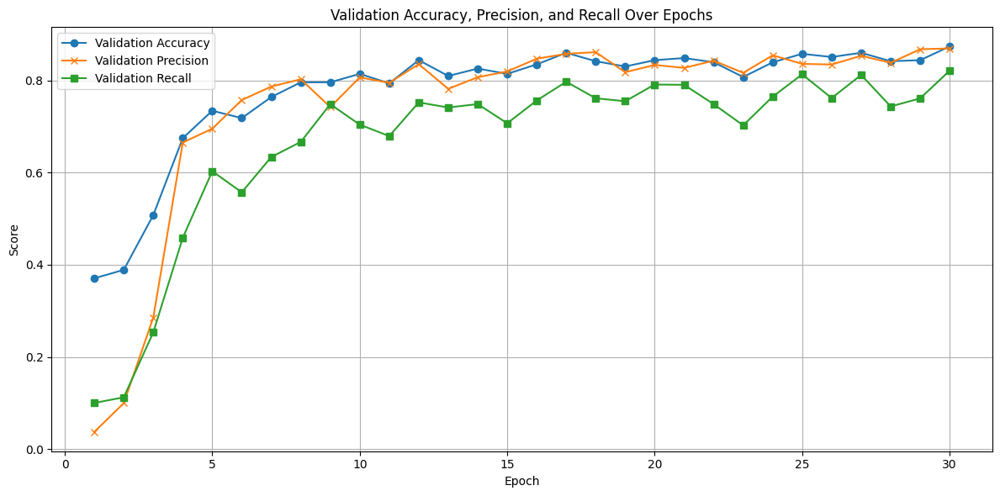

In [8]:
epochs = list(range(1, num_epochs + 1))

plt.figure(figsize=(12, 6))
plt.plot(epochs, val_accuracies, label="Validation Accuracy", marker='o')
plt.plot(epochs, val_precisions, label="Validation Precision", marker='x')
plt.plot(epochs, val_recalls, label="Validation Recall", marker='s')
plt.xlabel("Epoch")
plt.ylabel("Score")
plt.title("Validation Accuracy, Precision, and Recall Over Epochs")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Hyperparameter Tuning

In [16]:
import torch
from torch import nn, Tensor
from torch.optim import Adam, Optimizer
from torch.utils.data import DataLoader
from torchvision.models import resnet18
from sklearn.metrics import precision_score, recall_score
from tqdm import tqdm
import matplotlib.pyplot as plt
from collections import defaultdict
from typing import Tuple

# Define hyperparameter options
learning_rates: Tuple[float, float, float] = (0.01, 0.1, 0.0001)
batch_sizes: Tuple[int, int] = (64, 128)
num_epochs: int = 30

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Storage for all metrics
metrics = defaultdict(lambda: {"accuracy": [], "precision": [], "recall": []})

# Main training + validation loop
for lr in learning_rates:
    for batch_size in batch_sizes:
        print(f"\nTraining with learning rate = {lr}, batch size = {batch_size}")

        # Initialize model
        model: nn.Module = get_model(len(class_to_idx)).to(device)

        # Loss and optimizer
        criterion = nn.CrossEntropyLoss()
        optimizer: Optimizer = Adam(model.parameters(), lr=lr)

        # DataLoaders
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)

        # Epoch loop
        for epoch in range(num_epochs):
            model.train()
            correct_train = 0
            total_train = 0

            for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
                images, labels = images.to(device), labels.to(device)
                optimizer.zero_grad()
                outputs: Tensor = model(images)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()

                _, preds = torch.max(outputs, 1)
                correct_train += (preds == labels).sum().item()
                total_train += labels.size(0)

            train_acc = correct_train / total_train

            # Validation
            model.eval()
            correct_val = 0
            total_val = 0
            all_preds = []
            all_labels = []

            with torch.no_grad():
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    outputs: Tensor = model(images)
                    _, preds = torch.max(outputs, 1)
                    correct_val += (preds == labels).sum().item()
                    total_val += labels.size(0)
                    all_preds.extend(preds.cpu().numpy())
                    all_labels.extend(labels.cpu().numpy())

            val_acc = correct_val / total_val
            val_prec = precision_score(all_labels, all_preds, average='macro', zero_division=0)
            val_rec = recall_score(all_labels, all_preds, average='macro', zero_division=0)

            # Store metrics
            config_key = f"LR={lr}, BS={batch_size}"
            metrics[config_key]["accuracy"].append(val_acc)
            metrics[config_key]["precision"].append(val_prec)
            metrics[config_key]["recall"].append(val_rec)

            print(f"Epoch {epoch+1}: Train Acc={train_acc:.4f} | Val Acc={val_acc:.4f} | "
                  f"Precision={val_prec:.4f} | Recall={val_rec:.4f}")



Training with learning rate = 0.01, batch size = 64


Epoch 1/30: 100%|██████████| 16/16 [00:02<00:00,  5.44it/s]


Epoch 1: Train Acc=0.2365 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 2/30: 100%|██████████| 16/16 [00:02<00:00,  6.09it/s]


Epoch 2: Train Acc=0.3582 | Val Acc=0.3776 | Precision=0.0876 | Recall=0.1046


Epoch 3/30: 100%|██████████| 16/16 [00:02<00:00,  7.48it/s]


Epoch 3: Train Acc=0.3680 | Val Acc=0.4371 | Precision=0.2741 | Recall=0.1816


Epoch 4/30: 100%|██████████| 16/16 [00:02<00:00,  7.56it/s]


Epoch 4: Train Acc=0.4603 | Val Acc=0.4920 | Precision=0.3756 | Recall=0.2843


Epoch 5/30: 100%|██████████| 16/16 [00:02<00:00,  6.50it/s]


Epoch 5: Train Acc=0.5564 | Val Acc=0.5561 | Precision=0.5827 | Recall=0.3599


Epoch 6/30: 100%|██████████| 16/16 [00:02<00:00,  6.24it/s]


Epoch 6: Train Acc=0.6290 | Val Acc=0.5538 | Precision=0.5398 | Recall=0.3729


Epoch 7/30: 100%|██████████| 16/16 [00:02<00:00,  6.15it/s]


Epoch 7: Train Acc=0.6791 | Val Acc=0.5744 | Precision=0.5280 | Recall=0.4221


Epoch 8/30: 100%|██████████| 16/16 [00:02<00:00,  5.34it/s]


Epoch 8: Train Acc=0.7125 | Val Acc=0.6064 | Precision=0.6421 | Recall=0.4470


Epoch 9/30: 100%|██████████| 16/16 [00:02<00:00,  5.94it/s]


Epoch 9: Train Acc=0.7458 | Val Acc=0.6110 | Precision=0.5865 | Recall=0.4819


Epoch 10/30: 100%|██████████| 16/16 [00:02<00:00,  7.63it/s]


Epoch 10: Train Acc=0.7831 | Val Acc=0.6178 | Precision=0.5546 | Recall=0.4896


Epoch 11/30: 100%|██████████| 16/16 [00:02<00:00,  7.66it/s]


Epoch 11: Train Acc=0.8302 | Val Acc=0.6407 | Precision=0.5974 | Recall=0.5009


Epoch 12/30: 100%|██████████| 16/16 [00:02<00:00,  7.57it/s]


Epoch 12: Train Acc=0.8469 | Val Acc=0.6156 | Precision=0.5789 | Recall=0.4932


Epoch 13/30: 100%|██████████| 16/16 [00:02<00:00,  6.04it/s]


Epoch 13: Train Acc=0.8459 | Val Acc=0.6407 | Precision=0.6555 | Recall=0.5128


Epoch 14/30: 100%|██████████| 16/16 [00:02<00:00,  7.64it/s]


Epoch 14: Train Acc=0.8577 | Val Acc=0.6522 | Precision=0.6505 | Recall=0.5253


Epoch 15/30: 100%|██████████| 16/16 [00:02<00:00,  7.57it/s]


Epoch 15: Train Acc=0.8557 | Val Acc=0.6407 | Precision=0.5966 | Recall=0.5408


Epoch 16/30: 100%|██████████| 16/16 [00:02<00:00,  7.72it/s]


Epoch 16: Train Acc=0.8832 | Val Acc=0.6636 | Precision=0.6289 | Recall=0.5630


Epoch 17/30: 100%|██████████| 16/16 [00:02<00:00,  6.20it/s]


Epoch 17: Train Acc=0.8832 | Val Acc=0.6819 | Precision=0.6299 | Recall=0.6105


Epoch 18/30: 100%|██████████| 16/16 [00:02<00:00,  7.58it/s]


Epoch 18: Train Acc=0.8813 | Val Acc=0.6384 | Precision=0.5775 | Recall=0.5403


Epoch 19/30: 100%|██████████| 16/16 [00:02<00:00,  7.59it/s]


Epoch 19: Train Acc=0.8714 | Val Acc=0.6476 | Precision=0.6013 | Recall=0.5658


Epoch 20/30: 100%|██████████| 16/16 [00:02<00:00,  7.61it/s]


Epoch 20: Train Acc=0.9078 | Val Acc=0.6659 | Precision=0.6685 | Recall=0.5444


Epoch 21/30: 100%|██████████| 16/16 [00:02<00:00,  6.50it/s]


Epoch 21: Train Acc=0.9097 | Val Acc=0.6636 | Precision=0.6840 | Recall=0.5211


Epoch 22/30: 100%|██████████| 16/16 [00:02<00:00,  6.85it/s]


Epoch 22: Train Acc=0.9136 | Val Acc=0.6865 | Precision=0.6766 | Recall=0.5607


Epoch 23/30: 100%|██████████| 16/16 [00:02<00:00,  7.68it/s]


Epoch 23: Train Acc=0.9136 | Val Acc=0.7002 | Precision=0.6784 | Recall=0.5985


Epoch 24/30: 100%|██████████| 16/16 [00:02<00:00,  7.60it/s]


Epoch 24: Train Acc=0.9087 | Val Acc=0.6430 | Precision=0.6080 | Recall=0.5545


Epoch 25/30: 100%|██████████| 16/16 [00:02<00:00,  6.34it/s]


Epoch 25: Train Acc=0.9078 | Val Acc=0.6888 | Precision=0.6625 | Recall=0.5803


Epoch 26/30: 100%|██████████| 16/16 [00:02<00:00,  7.56it/s]


Epoch 26: Train Acc=0.9323 | Val Acc=0.6796 | Precision=0.6072 | Recall=0.5910


Epoch 27/30: 100%|██████████| 16/16 [00:02<00:00,  7.50it/s]


Epoch 27: Train Acc=0.9107 | Val Acc=0.6842 | Precision=0.6546 | Recall=0.5813


Epoch 28/30: 100%|██████████| 16/16 [00:02<00:00,  7.51it/s]


Epoch 28: Train Acc=0.9244 | Val Acc=0.6773 | Precision=0.6585 | Recall=0.5583


Epoch 29/30: 100%|██████████| 16/16 [00:02<00:00,  6.43it/s]


Epoch 29: Train Acc=0.9136 | Val Acc=0.6682 | Precision=0.6838 | Recall=0.5822


Epoch 30/30: 100%|██████████| 16/16 [00:02<00:00,  7.59it/s]


Epoch 30: Train Acc=0.9136 | Val Acc=0.6568 | Precision=0.6548 | Recall=0.5699

Training with learning rate = 0.01, batch size = 128


Epoch 1/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 1: Train Acc=0.1698 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 2/30: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


Epoch 2: Train Acc=0.3268 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 3/30: 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]


Epoch 3: Train Acc=0.3592 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 4/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 4: Train Acc=0.3592 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 5/30: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


Epoch 5: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 6/30: 100%|██████████| 8/8 [00:02<00:00,  3.18it/s]


Epoch 6: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 7/30: 100%|██████████| 8/8 [00:02<00:00,  3.35it/s]


Epoch 7: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 8/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 8: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 9/30: 100%|██████████| 8/8 [00:02<00:00,  3.89it/s]


Epoch 9: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 10/30: 100%|██████████| 8/8 [00:02<00:00,  3.95it/s]


Epoch 10: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 11/30: 100%|██████████| 8/8 [00:02<00:00,  3.65it/s]


Epoch 11: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 12/30: 100%|██████████| 8/8 [00:02<00:00,  3.59it/s]


Epoch 12: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 13/30: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


Epoch 13: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 14/30: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


Epoch 14: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 15/30: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Epoch 15: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 16/30: 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]


Epoch 16: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 17/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 17: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 18/30: 100%|██████████| 8/8 [00:02<00:00,  3.89it/s]


Epoch 18: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 19/30: 100%|██████████| 8/8 [00:02<00:00,  3.93it/s]


Epoch 19: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 20/30: 100%|██████████| 8/8 [00:02<00:00,  3.28it/s]


Epoch 20: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 21/30: 100%|██████████| 8/8 [00:02<00:00,  3.91it/s]


Epoch 21: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 22/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 22: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 23/30: 100%|██████████| 8/8 [00:02<00:00,  3.93it/s]


Epoch 23: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 24/30: 100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 24: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 25/30: 100%|██████████| 8/8 [00:02<00:00,  3.94it/s]


Epoch 25: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 26/30: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


Epoch 26: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 27/30: 100%|██████████| 8/8 [00:02<00:00,  3.35it/s]


Epoch 27: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 28/30: 100%|██████████| 8/8 [00:02<00:00,  3.13it/s]


Epoch 28: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 29/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 29: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 30/30: 100%|██████████| 8/8 [00:02<00:00,  3.94it/s]


Epoch 30: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000

Training with learning rate = 0.1, batch size = 64


Epoch 1/30: 100%|██████████| 16/16 [00:02<00:00,  7.55it/s]


Epoch 1: Train Acc=0.2139 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 2/30: 100%|██████████| 16/16 [00:02<00:00,  5.92it/s]


Epoch 2: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 3/30: 100%|██████████| 16/16 [00:02<00:00,  7.60it/s]


Epoch 3: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 4/30: 100%|██████████| 16/16 [00:02<00:00,  7.66it/s]


Epoch 4: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 5/30: 100%|██████████| 16/16 [00:02<00:00,  7.68it/s]


Epoch 5: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 6/30: 100%|██████████| 16/16 [00:02<00:00,  5.99it/s]


Epoch 6: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 7/30: 100%|██████████| 16/16 [00:02<00:00,  7.56it/s]


Epoch 7: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 8/30: 100%|██████████| 16/16 [00:02<00:00,  7.54it/s]


Epoch 8: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 9/30: 100%|██████████| 16/16 [00:02<00:00,  7.62it/s]


Epoch 9: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 10/30: 100%|██████████| 16/16 [00:02<00:00,  6.14it/s]


Epoch 10: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 11/30: 100%|██████████| 16/16 [00:02<00:00,  7.67it/s]


Epoch 11: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 12/30: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]


Epoch 12: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 13/30: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]


Epoch 13: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 14/30: 100%|██████████| 16/16 [00:02<00:00,  7.62it/s]


Epoch 14: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 15/30: 100%|██████████| 16/16 [00:02<00:00,  7.58it/s]


Epoch 15: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 16/30: 100%|██████████| 16/16 [00:02<00:00,  6.35it/s]


Epoch 16: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 17/30: 100%|██████████| 16/16 [00:02<00:00,  7.73it/s]


Epoch 17: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 18/30: 100%|██████████| 16/16 [00:02<00:00,  7.67it/s]


Epoch 18: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 19/30: 100%|██████████| 16/16 [00:02<00:00,  7.55it/s]


Epoch 19: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 20/30: 100%|██████████| 16/16 [00:02<00:00,  6.36it/s]


Epoch 20: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 21/30: 100%|██████████| 16/16 [00:02<00:00,  7.59it/s]


Epoch 21: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 22/30: 100%|██████████| 16/16 [00:02<00:00,  7.64it/s]


Epoch 22: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 23/30: 100%|██████████| 16/16 [00:02<00:00,  7.59it/s]


Epoch 23: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 24/30: 100%|██████████| 16/16 [00:02<00:00,  6.52it/s]


Epoch 24: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 25/30: 100%|██████████| 16/16 [00:02<00:00,  7.57it/s]


Epoch 25: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 26/30: 100%|██████████| 16/16 [00:02<00:00,  7.60it/s]


Epoch 26: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 27/30: 100%|██████████| 16/16 [00:02<00:00,  7.57it/s]


Epoch 27: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 28/30: 100%|██████████| 16/16 [00:02<00:00,  6.63it/s]


Epoch 28: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 29/30: 100%|██████████| 16/16 [00:02<00:00,  7.55it/s]


Epoch 29: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 30/30: 100%|██████████| 16/16 [00:02<00:00,  7.42it/s]


Epoch 30: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000

Training with learning rate = 0.1, batch size = 128


Epoch 1/30: 100%|██████████| 8/8 [00:02<00:00,  3.80it/s]


Epoch 1: Train Acc=0.1629 | Val Acc=0.1007 | Precision=0.0101 | Recall=0.1000


Epoch 2/30: 100%|██████████| 8/8 [00:02<00:00,  3.41it/s]


Epoch 2: Train Acc=0.2130 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 3/30: 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]


Epoch 3: Train Acc=0.2502 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 4/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 4: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 5/30: 100%|██████████| 8/8 [00:02<00:00,  3.80it/s]


Epoch 5: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 6/30: 100%|██████████| 8/8 [00:02<00:00,  3.49it/s]


Epoch 6: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 7/30: 100%|██████████| 8/8 [00:02<00:00,  3.79it/s]


Epoch 7: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 8/30: 100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


Epoch 8: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 9/30: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Epoch 9: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 10/30: 100%|██████████| 8/8 [00:02<00:00,  3.48it/s]


Epoch 10: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 11/30: 100%|██████████| 8/8 [00:02<00:00,  3.71it/s]


Epoch 11: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 12/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 12: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 13/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 13: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 14/30: 100%|██████████| 8/8 [00:02<00:00,  3.60it/s]


Epoch 14: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 15/30: 100%|██████████| 8/8 [00:02<00:00,  3.51it/s]


Epoch 15: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 16/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 16: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 17/30: 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]


Epoch 17: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 18/30: 100%|██████████| 8/8 [00:02<00:00,  3.57it/s]


Epoch 18: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 19/30: 100%|██████████| 8/8 [00:02<00:00,  3.76it/s]


Epoch 19: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 20/30: 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]


Epoch 20: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 21/30: 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]


Epoch 21: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 22/30: 100%|██████████| 8/8 [00:02<00:00,  3.44it/s]


Epoch 22: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 23/30: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Epoch 23: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 24/30: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Epoch 24: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 25/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 25: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 26/30: 100%|██████████| 8/8 [00:02<00:00,  3.45it/s]


Epoch 26: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 27/30: 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]


Epoch 27: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 28/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 28: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 29/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 29: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 30/30: 100%|██████████| 8/8 [00:02<00:00,  3.54it/s]


Epoch 30: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000

Training with learning rate = 0.0001, batch size = 64


Epoch 1/30: 100%|██████████| 16/16 [00:02<00:00,  7.36it/s]


Epoch 1: Train Acc=0.3405 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 2/30: 100%|██████████| 16/16 [00:02<00:00,  7.65it/s]


Epoch 2: Train Acc=0.3582 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 3/30: 100%|██████████| 16/16 [00:02<00:00,  7.58it/s]


Epoch 3: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 4/30: 100%|██████████| 16/16 [00:02<00:00,  7.08it/s]


Epoch 4: Train Acc=0.3631 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 5/30: 100%|██████████| 16/16 [00:02<00:00,  6.96it/s]


Epoch 5: Train Acc=0.3749 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 6/30: 100%|██████████| 16/16 [00:02<00:00,  7.57it/s]


Epoch 6: Train Acc=0.3739 | Val Acc=0.3890 | Precision=0.1108 | Recall=0.1123


Epoch 7/30: 100%|██████████| 16/16 [00:02<00:00,  7.62it/s]


Epoch 7: Train Acc=0.4112 | Val Acc=0.3982 | Precision=0.1106 | Recall=0.1194


Epoch 8/30: 100%|██████████| 16/16 [00:02<00:00,  7.27it/s]


Epoch 8: Train Acc=0.4220 | Val Acc=0.4302 | Precision=0.1586 | Recall=0.1462


Epoch 9/30: 100%|██████████| 16/16 [00:02<00:00,  6.79it/s]


Epoch 9: Train Acc=0.4553 | Val Acc=0.4600 | Precision=0.1686 | Recall=0.1918


Epoch 10/30: 100%|██████████| 16/16 [00:02<00:00,  7.52it/s]


Epoch 10: Train Acc=0.4750 | Val Acc=0.4691 | Precision=0.1927 | Recall=0.1957


Epoch 11/30: 100%|██████████| 16/16 [00:02<00:00,  7.54it/s]


Epoch 11: Train Acc=0.5005 | Val Acc=0.4760 | Precision=0.4401 | Recall=0.2122


Epoch 12/30: 100%|██████████| 16/16 [00:02<00:00,  7.35it/s]


Epoch 12: Train Acc=0.5172 | Val Acc=0.4668 | Precision=0.4849 | Recall=0.2096


Epoch 13/30: 100%|██████████| 16/16 [00:02<00:00,  6.70it/s]


Epoch 13: Train Acc=0.5280 | Val Acc=0.4920 | Precision=0.4445 | Recall=0.2266


Epoch 14/30: 100%|██████████| 16/16 [00:02<00:00,  7.52it/s]


Epoch 14: Train Acc=0.5780 | Val Acc=0.5286 | Precision=0.5213 | Recall=0.2755


Epoch 15/30: 100%|██████████| 16/16 [00:02<00:00,  7.41it/s]


Epoch 15: Train Acc=0.5849 | Val Acc=0.5629 | Precision=0.5036 | Recall=0.3276


Epoch 16/30: 100%|██████████| 16/16 [00:02<00:00,  7.37it/s]


Epoch 16: Train Acc=0.6163 | Val Acc=0.6156 | Precision=0.6347 | Recall=0.4312


Epoch 17/30: 100%|██████████| 16/16 [00:02<00:00,  6.89it/s]


Epoch 17: Train Acc=0.6447 | Val Acc=0.5698 | Precision=0.7170 | Recall=0.3486


Epoch 18/30: 100%|██████████| 16/16 [00:02<00:00,  7.48it/s]


Epoch 18: Train Acc=0.6379 | Val Acc=0.6201 | Precision=0.6566 | Recall=0.4185


Epoch 19/30: 100%|██████████| 16/16 [00:02<00:00,  7.48it/s]


Epoch 19: Train Acc=0.6742 | Val Acc=0.6430 | Precision=0.6420 | Recall=0.4620


Epoch 20/30: 100%|██████████| 16/16 [00:02<00:00,  7.41it/s]


Epoch 20: Train Acc=0.7223 | Val Acc=0.6545 | Precision=0.6237 | Recall=0.4548


Epoch 21/30: 100%|██████████| 16/16 [00:02<00:00,  6.58it/s]


Epoch 21: Train Acc=0.7115 | Val Acc=0.6636 | Precision=0.7037 | Recall=0.4634


Epoch 22/30: 100%|██████████| 16/16 [00:02<00:00,  7.58it/s]


Epoch 22: Train Acc=0.7448 | Val Acc=0.6590 | Precision=0.6629 | Recall=0.4819


Epoch 23/30: 100%|██████████| 16/16 [00:02<00:00,  7.56it/s]


Epoch 23: Train Acc=0.7468 | Val Acc=0.6613 | Precision=0.6721 | Recall=0.4812


Epoch 24/30: 100%|██████████| 16/16 [00:02<00:00,  7.63it/s]


Epoch 24: Train Acc=0.7566 | Val Acc=0.6911 | Precision=0.7463 | Recall=0.5422


Epoch 25/30: 100%|██████████| 16/16 [00:02<00:00,  6.38it/s]


Epoch 25: Train Acc=0.7586 | Val Acc=0.6865 | Precision=0.7433 | Recall=0.5216


Epoch 26/30: 100%|██████████| 16/16 [00:02<00:00,  7.36it/s]


Epoch 26: Train Acc=0.7870 | Val Acc=0.7231 | Precision=0.7170 | Recall=0.5655


Epoch 27/30: 100%|██████████| 16/16 [00:02<00:00,  7.53it/s]


Epoch 27: Train Acc=0.7900 | Val Acc=0.7094 | Precision=0.6935 | Recall=0.5433


Epoch 28/30: 100%|██████████| 16/16 [00:02<00:00,  7.51it/s]


Epoch 28: Train Acc=0.8027 | Val Acc=0.7323 | Precision=0.7428 | Recall=0.5649


Epoch 29/30: 100%|██████████| 16/16 [00:02<00:00,  6.58it/s]


Epoch 29: Train Acc=0.8351 | Val Acc=0.7391 | Precision=0.7448 | Recall=0.6132


Epoch 30/30: 100%|██████████| 16/16 [00:02<00:00,  7.60it/s]


Epoch 30: Train Acc=0.8165 | Val Acc=0.7346 | Precision=0.7593 | Recall=0.5987

Training with learning rate = 0.0001, batch size = 128


Epoch 1/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 1: Train Acc=0.2954 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 2/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 2: Train Acc=0.3611 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 3/30: 100%|██████████| 8/8 [00:02<00:00,  3.25it/s]


Epoch 3: Train Acc=0.3562 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 4/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 4: Train Acc=0.3592 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 5/30: 100%|██████████| 8/8 [00:02<00:00,  3.80it/s]


Epoch 5: Train Acc=0.3641 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 6/30: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Epoch 6: Train Acc=0.3651 | Val Acc=0.3707 | Precision=0.0371 | Recall=0.1000


Epoch 7/30: 100%|██████████| 8/8 [00:02<00:00,  3.28it/s]


Epoch 7: Train Acc=0.3778 | Val Acc=0.3730 | Precision=0.1372 | Recall=0.1015


Epoch 8/30: 100%|██████████| 8/8 [00:02<00:00,  3.89it/s]


Epoch 8: Train Acc=0.3798 | Val Acc=0.3776 | Precision=0.1373 | Recall=0.1046


Epoch 9/30: 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]


Epoch 9: Train Acc=0.4014 | Val Acc=0.4142 | Precision=0.1051 | Recall=0.1311


Epoch 10/30: 100%|██████████| 8/8 [00:02<00:00,  3.92it/s]


Epoch 10: Train Acc=0.4053 | Val Acc=0.4096 | Precision=0.1070 | Recall=0.1280


Epoch 11/30: 100%|██████████| 8/8 [00:02<00:00,  3.08it/s]


Epoch 11: Train Acc=0.4308 | Val Acc=0.4416 | Precision=0.0986 | Recall=0.1514


Epoch 12/30: 100%|██████████| 8/8 [00:02<00:00,  3.93it/s]


Epoch 12: Train Acc=0.4436 | Val Acc=0.4416 | Precision=0.2001 | Recall=0.1558


Epoch 13/30: 100%|██████████| 8/8 [00:02<00:00,  3.96it/s]


Epoch 13: Train Acc=0.4652 | Val Acc=0.4485 | Precision=0.2006 | Recall=0.1613


Epoch 14/30: 100%|██████████| 8/8 [00:02<00:00,  3.86it/s]


Epoch 14: Train Acc=0.4760 | Val Acc=0.4622 | Precision=0.1793 | Recall=0.1739


Epoch 15/30: 100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 15: Train Acc=0.4769 | Val Acc=0.4805 | Precision=0.3203 | Recall=0.2032


Epoch 16/30: 100%|██████████| 8/8 [00:02<00:00,  3.91it/s]


Epoch 16: Train Acc=0.5025 | Val Acc=0.4783 | Precision=0.4170 | Recall=0.2070


Epoch 17/30: 100%|██████████| 8/8 [00:02<00:00,  3.87it/s]


Epoch 17: Train Acc=0.5299 | Val Acc=0.5080 | Precision=0.4618 | Recall=0.2474


Epoch 18/30: 100%|██████████| 8/8 [00:02<00:00,  3.85it/s]


Epoch 18: Train Acc=0.5486 | Val Acc=0.5217 | Precision=0.6016 | Recall=0.2690


Epoch 19/30: 100%|██████████| 8/8 [00:02<00:00,  3.01it/s]


Epoch 19: Train Acc=0.5623 | Val Acc=0.5149 | Precision=0.5085 | Recall=0.2545


Epoch 20/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 20: Train Acc=0.5800 | Val Acc=0.5309 | Precision=0.5018 | Recall=0.2877


Epoch 21/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 21: Train Acc=0.6173 | Val Acc=0.5423 | Precision=0.4861 | Recall=0.2982


Epoch 22/30: 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]


Epoch 22: Train Acc=0.6065 | Val Acc=0.5812 | Precision=0.6324 | Recall=0.3562


Epoch 23/30: 100%|██████████| 8/8 [00:02<00:00,  3.02it/s]


Epoch 23: Train Acc=0.6153 | Val Acc=0.6041 | Precision=0.5609 | Recall=0.3757


Epoch 24/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 24: Train Acc=0.6330 | Val Acc=0.5927 | Precision=0.5103 | Recall=0.3645


Epoch 25/30: 100%|██████████| 8/8 [00:02<00:00,  3.84it/s]


Epoch 25: Train Acc=0.6467 | Val Acc=0.5812 | Precision=0.5999 | Recall=0.3446


Epoch 26/30: 100%|██████████| 8/8 [00:02<00:00,  3.83it/s]


Epoch 26: Train Acc=0.6555 | Val Acc=0.6018 | Precision=0.6203 | Recall=0.3832


Epoch 27/30: 100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


Epoch 27: Train Acc=0.6928 | Val Acc=0.6453 | Precision=0.5653 | Recall=0.4393


Epoch 28/30: 100%|██████████| 8/8 [00:02<00:00,  3.82it/s]


Epoch 28: Train Acc=0.6830 | Val Acc=0.6453 | Precision=0.6579 | Recall=0.4641


Epoch 29/30: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Epoch 29: Train Acc=0.7056 | Val Acc=0.6476 | Precision=0.5664 | Recall=0.4400


Epoch 30/30: 100%|██████████| 8/8 [00:02<00:00,  3.90it/s]


Epoch 30: Train Acc=0.6899 | Val Acc=0.6545 | Precision=0.6768 | Recall=0.4833


Classification Report:

                   precision    recall  f1-score   support

     Ariel_Sharon       0.73      0.55      0.63        20
     Colin_Powell       0.61      0.80      0.69        65
  Donald_Rumsfeld       0.75      0.24      0.36        38
    George_W_Bush       0.68      0.95      0.79       162
Gerhard_Schroeder       0.54      0.36      0.43        36
      Hugo_Chavez       0.73      0.35      0.47        23
    Jean_Chretien       0.67      0.17      0.27        12
    John_Ashcroft       0.50      0.53      0.52        15
Junichiro_Koizumi       1.00      0.45      0.62        22
       Tony_Blair       0.56      0.43      0.49        44

         accuracy                           0.65       437
        macro avg       0.68      0.48      0.53       437
     weighted avg       0.67      0.65      0.62       437



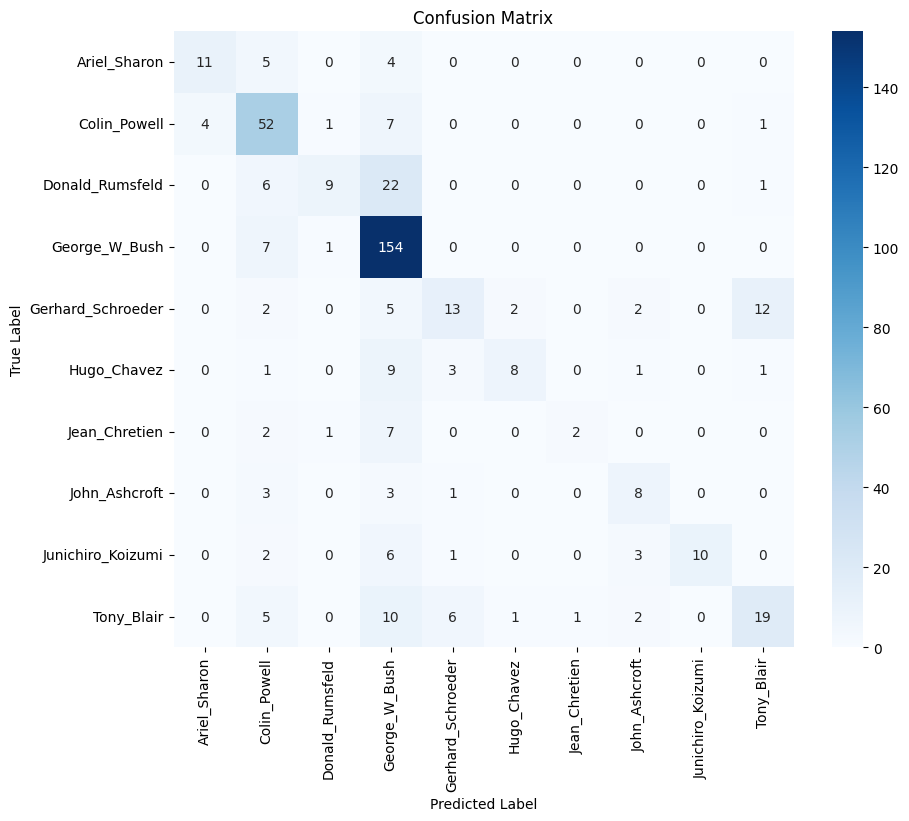

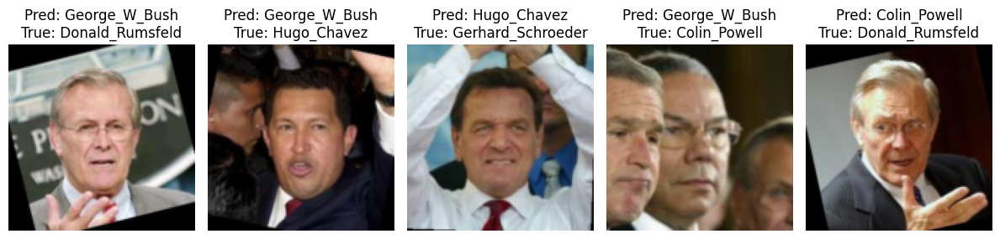

In [17]:
from sklearn.metrics import classification_report, confusion_matrix # Import the function
import seaborn as sns
# Set model to evaluation mode
model.eval()

# Collect predictions and true labels
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in val_loader:  # use test_loader if you have it
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Classification Report
print("Classification Report:\n")
print(classification_report(all_labels, all_preds, target_names=list(class_to_idx.keys())))

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(class_to_idx.keys()),
            yticklabels=list(class_to_idx.keys()))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Misclassified Images (Optional)
misclassified_images = []
model.eval()

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        for i in range(len(labels)):
            if preds[i] != labels[i]:
                misclassified_images.append((inputs[i].cpu(), preds[i].cpu(), labels[i].cpu()))
            if len(misclassified_images) >= 5:
                break
        if len(misclassified_images) >= 5:
            break

# Display Misclassified Images
plt.figure(figsize=(12, 6))
for i, (img, pred, label) in enumerate(misclassified_images):
    plt.subplot(1, 5, i+1)
    img = img.permute(1, 2, 0).numpy() * 0.5 + 0.5  # Unnormalize
    plt.imshow(img)
    plt.title(f"Pred: {list(class_to_idx.keys())[pred]}\nTrue: {list(class_to_idx.keys())[label]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

# Plot after Hyperparameter Tuning

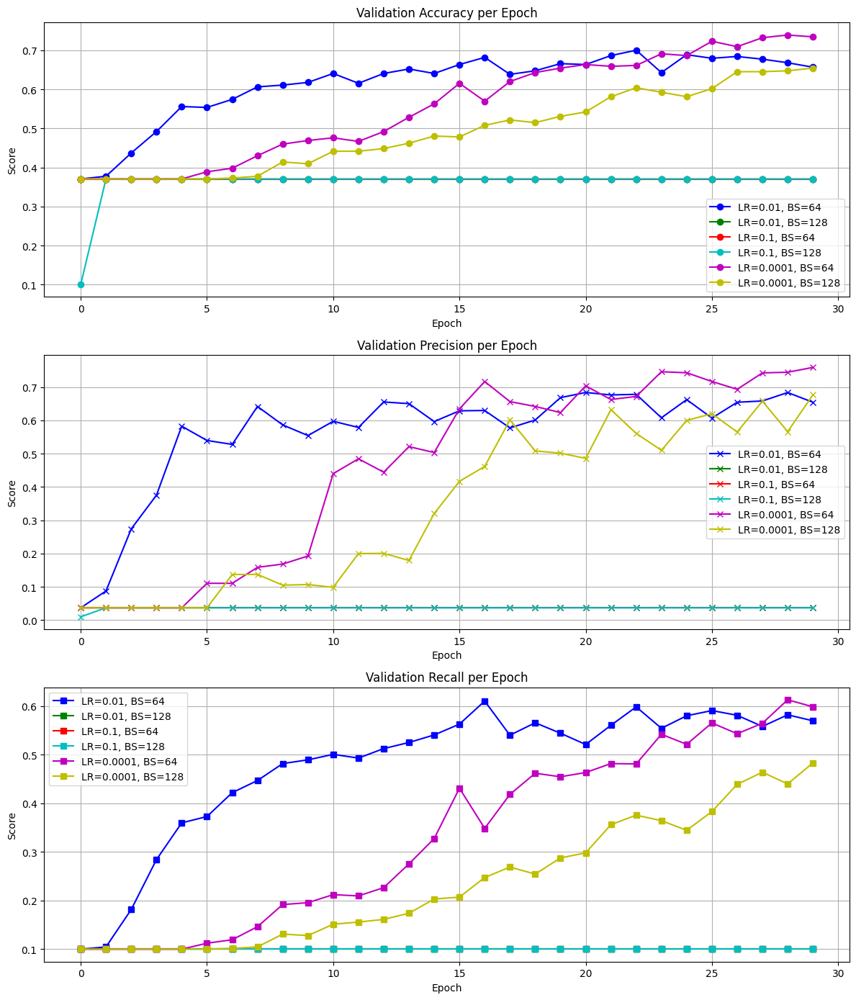

In [18]:
# Plotting
fig, axs = plt.subplots(3, 1, figsize=(12, 14))
colors = ['b', 'g', 'r', 'c', 'm', 'y']

for i, (config_key, values) in enumerate(metrics.items()):
    axs[0].plot(values["accuracy"], label=config_key, color=colors[i % len(colors)], marker='o')
    axs[1].plot(values["precision"], label=config_key, color=colors[i % len(colors)], marker='x')
    axs[2].plot(values["recall"], label=config_key, color=colors[i % len(colors)], marker='s')

axs[0].set_title("Validation Accuracy per Epoch")
axs[1].set_title("Validation Precision per Epoch")
axs[2].set_title("Validation Recall per Epoch")

for ax in axs:
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Score")
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()


#  Final Model Testing

In [26]:
# Final evaluation of the best model
from sklearn.metrics import precision_score, recall_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

correct_test = 0
total_test = 0
all_preds_test = []
all_labels_test = []

with torch.no_grad():  # Disable gradient calculation for testing
    for images, labels in tqdm(val_loader, desc="Final Model Testing"):  # Use test_loader if you have one
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        correct_test += (preds == labels).sum().item()
        total_test += labels.size(0)

        all_preds_test.extend(preds.cpu().numpy())
        all_labels_test.extend(labels.cpu().numpy())

# Final metrics
test_accuracy = correct_test / total_test
test_precision = precision_score(all_labels_test, all_preds_test, average='macro', zero_division=0)
test_recall = recall_score(all_labels_test, all_preds_test, average='macro', zero_division=0)

print(f" Final Model Test Results:")
print(f"   Accuracy:  {test_accuracy:.4f}")
print(f"   Precision: {test_precision:.4f}")
print(f"   Recall:    {test_recall:.4f}")


Final Model Testing: 100%|██████████| 4/4 [00:01<00:00,  3.21it/s]

 Final Model Test Results:
   Accuracy:  0.6545
   Precision: 0.6768
   Recall:    0.4833


# Adding GradCAM

In [20]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        # Use register_backward_hook instead of register_full_backward_hook
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, input_tensor, class_idx=None):
        self.model.eval()
        output = self.model(input_tensor)

        if class_idx is None:
            class_idx = torch.argmax(output, dim=1).item()

        self.model.zero_grad()
        output[0, class_idx].backward()

        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])
        activations = self.activations.squeeze()

        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i]

        heatmap = torch.mean(activations, dim=0).cpu().numpy()
        heatmap = np.maximum(heatmap, 0)
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
        return heatmap

In [21]:
def show_cam_on_image(img_tensor, mask):
    img = img_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
    img = (img - img.min()) / (img.max() - img.min())
    h, w, _ = img.shape

    mask_resized = cv2.resize(mask, (w, h))
    heatmap = cv2.applyColorMap(np.uint8(255 * mask_resized), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    overlay = heatmap + img
    overlay = overlay / np.max(overlay)

    plt.figure(figsize=(2, 2))
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("GradCAM Result")
    plt.show()


In [23]:
from collections import OrderedDict


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


GradCAM for Sample #1, Label: 3


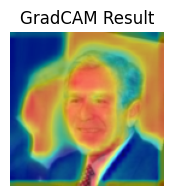

GradCAM for Sample #2, Label: 8


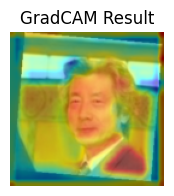

GradCAM for Sample #3, Label: 2


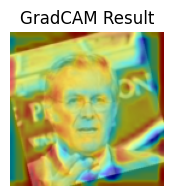

GradCAM for Sample #4, Label: 5


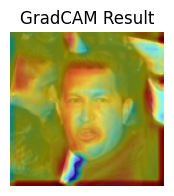

GradCAM for Sample #5, Label: 3


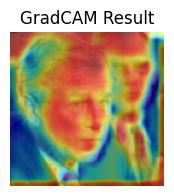

GradCAM for Sample #6, Label: 3


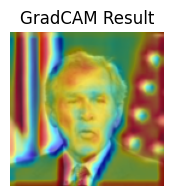

GradCAM for Sample #7, Label: 4


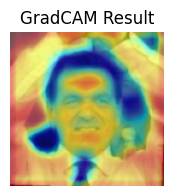

GradCAM for Sample #8, Label: 4


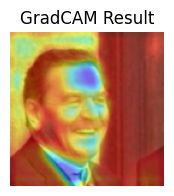

GradCAM for Sample #9, Label: 1


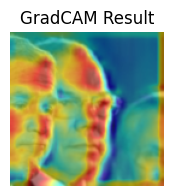

GradCAM for Sample #10, Label: 3


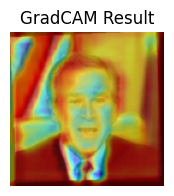

In [24]:
# Get a batch of images and labels
images, labels = next(iter(val_loader))

# Set model to eval
model.eval()

# Clear previous hooks (your code)
for name, module in model.named_modules():
    module._backward_hooks = OrderedDict()
    module._forward_pre_hooks = OrderedDict()
    module._forward_hooks = OrderedDict()

# Target conv layer
target_layer = model.features[6]

# Loop through first 5 images
num_samples = 10
for i in range(num_samples):
    input_tensor = images[i].unsqueeze(0).to(device)

    # Init GradCAM
    gradcam = GradCAM(model, target_layer)
    cam = gradcam.generate(input_tensor)

    print(f"GradCAM for Sample #{i+1}, Label: {labels[i].item()}")
    show_cam_on_image(input_tensor.cpu(), cam)
